# Imports

In [1]:
%%capture
!chmod -R 777 ../

In [2]:
# System and Path Operations
import sys
import os
from pathlib import Path
from glob import glob

# Imported Local Modules
sys.path.insert(0, '../')
from src.config import *
from src.utils import *
from src.models_arch import *
from src.models_utils import *
from src.metrices import *

# Basic Python Data Handling and Visualization Libraries
import random
import math
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import json

# Libraries for Image Processing
from PIL import Image
import skimage
from skimage.io import imread, imsave
from skimage import io
import tifffile as tiff

# Libraries for Model Evaluation and Validation
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
    f1_score,
)

# TensorFlow and Keras Libraries for Deep Learning
import tensorflow as tf
from tensorflow.keras.callbacks import (
    Callback,
    ModelCheckpoint,
    TensorBoard,
    ReduceLROnPlateau,
    CSVLogger,
    EarlyStopping,
)
import keras
from keras import backend as K
from keras.utils import Sequence
from tensorflow.keras.metrics import MeanIoU
from sklearn.metrics import accuracy_score, jaccard_score

# Setting seed for reproducibility
seed_value = 42
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)


2023-09-02 11:08:02.073281: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-02 11:08:02.876863: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
# Setting GPU's number
physical_devices=tf.config.experimental.list_physical_devices('GPU')
physical_devices

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU')]

In [4]:
# tf.config.set_visible_devices(physical_devices[:],'GPU')
tf.config.set_visible_devices(physical_devices[3],'GPU')

---

# Model Scoring Configuration

In this section, we define key parameters and hyperparameters necessary for scoring a trained deep learning model. Scoring involves evaluating the model's performance on a dataset or making predictions on new data using the saved weights.

### Model Parameters and Hyperparameters

- **Batch Size**: The `batch_size` parameter determines the number of data samples processed in each forward and backward pass during scoring. It impacts memory usage and inference speed.

- **RGB or RGBNIR**: The `trained_with_RGB` parameter is used to specify whether the model was trained with RGB-only data or RGBNIR data, indicating whether to consider RGB channels alone or both RGB and NIR channels during scoring.

- **Resizing**: The `need_resizing` parameter is a boolean flag that indicates whether the input data needs to be resized to match the model's input dimensions. This is often necessary when scoring with models that have specific input size requirements.

### Model Selection for Scoring

- **Model Name**: Choose the pre-trained model for scoring by specifying its name. The name should correspond to the saved model's directory inside the `saved_model` folder. In this code, 'UNetPlusPlus_SPARCS_epochs300_batch16_RGBNIR' is selected as the model for scoring.

### Checkpoint Path

- **Checkpoint Path**: The `ckpt_path` variable defines the path to the checkpoint file containing the saved weights of the selected model. These weights will be loaded during scoring to restore the model's state.

### Checkpoint Directory

- **Checkpoint Directory**: The `ckpt_dir` variable specifies the directory where the model's checkpoint file is located. This is useful for organizing and managing model checkpoints.

With these parameters and hyperparameters set, you can proceed to score the selected model on your dataset or new data, leveraging the pre-trained weights and configurations.

---

In [32]:
# Choose the model that you want to use for the scoring (the name of the model inside the saved_model folder)
model_name = 'CloudXNet_biome8_epochs100_batch16_RGB'

In [33]:
# Hyperparameters for the model
batch_size = model_name.split('_')[-2][-2:]

trained_with_RGB = True if model_name.split('_')[-1] == 'RGB' else False

need_resizing = True if ('DLV3' or 'CloudXNet') in model_name else False

batch_size, trained_with_RGB, need_resizing, 

(True, False, '16')

In [16]:
# Include the epoch in the file name (uses `str.format`)
ckpt_path = str(checkpoint_path / f"{model_name}/" / "best_model.ckpt")
ckpt_dir = os.path.dirname(ckpt_path)

# Load model
In this section you have two options of loading the model, depending on your necessity:
- Using the Tensorflow built-in function to load the full model
- Load just the best model weights

## Full

In [17]:
# Load the model
new_model = tf.keras.models.load_model(Path(saved_models_path, f"{model_name}.h5"), compile=False)

# Load training history
with open(Path(train_history_path, f'{model_name}.json'), 'r') as f:
    loaded_history = json.load(f)

# Check its architecture
new_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 4)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   592         ['input_1[0][0]']                
                                16)                                                               
                                                                                                  
 dropout (Dropout)              (None, None, None,   0           ['conv2d[0][0]']                 
                                16)                                                           

In [18]:
model = new_model
history = loaded_history

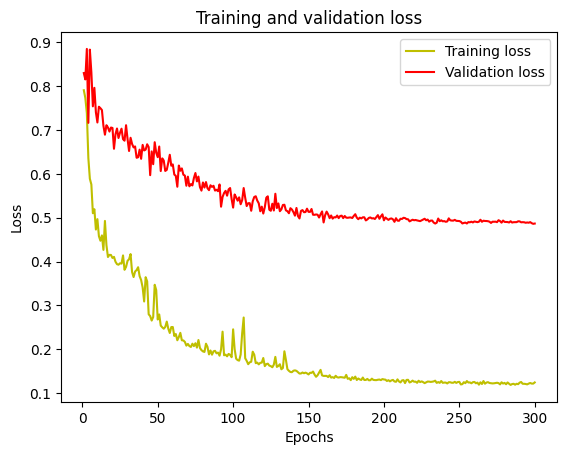

In [19]:
#plot the training and validation accuracy and loss at each epoch
loss = history['loss']
val_loss = history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [20]:
history.keys()

dict_keys(['loss', 'binary_crossentropy', 'binary_focal_crossentropy', 'bce_dice_loss', 'jacc_coef', 'auc', 'val_loss', 'val_binary_crossentropy', 'val_binary_focal_crossentropy', 'val_bce_dice_loss', 'val_jacc_coef', 'val_auc', 'lr'])

## Weights from checkpoint

In [9]:
# Upload the last checkpoint
latest = tf.train.latest_checkpoint(ckpt_dir)

# Create a new model instance(you need to choose the right architecture for the model you are loading)
# model = create_model(model_name='CXNet', IMG_HEIGHT=256 , IMG_WIDTH=256, IMG_CHANNELS=3)
model = create_model(model_name='cloud_net')

# Load the previously saved weights
model.load_weights(latest)

2023-08-31 09:17:21.804470: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-31 09:17:22.302613: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22311 MB memory:  -> device: 3, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:c2:00.0, compute capability: 8.6


# Data loading

In [3]:
def load_cloud95(include_nir=True, invert_rgb=True, exclude_edge_patches=True, resize_to=256, for_visual_scoring=False):
    
    dataset = Cloud95Dataset(Cloud95_additional/'train_red_additional_to38cloud', 
                             Cloud95_additional/'train_green_additional_to38cloud', 
                             Cloud95_additional/'train_blue_additional_to38cloud', 
                             Cloud95_additional/'train_nir_additional_to38cloud',
                             Cloud95_additional/'train_gt_additional_to38cloud')
        
    if for_visual_scoring:
        X = np.array([dataset.open_as_array(idx, include_nir=False, false_color_aug=False, invert_rgb=False).astype(np.float32) for idx in range(3000)])
        y = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in range(len(dataset))])
    else:
        X = np.array([dataset.open_as_array(idx, include_nir=include_nir, invert_rgb=invert_rgb).astype(np.float32) for idx in range(3000)])
        y = np.array([dataset.open_mask(idx, add_dims=True).astype(np.int32) for idx in range(len(dataset))])
        
    
    if exclude_edge_patches:
        non_zero_idxs = [index for index, img in enumerate(X) if not np.any(img == 0)]
        X, y = X[non_zero_idxs], y[non_zero_idxs]
    
    if need_resizing:
        X = resize_image(X, new_dim=((X.shape[0], resize_to, resize_to, X.shape[-1])))
        y = resize_image(y, new_dim=((y.shape[0], resize_to, resize_to, y.shape[-1])))
        
    # print(X.shape, y.shape)
        
    return X, y


def predict_cloud95(X, threshold):
    preds = []
    for x in X:
        y_pred = model.predict(x, verbose=0)
        preds.append(y_pred)
        
    preds = np.array(preds)
    
    # Apply threshold
    y_pred_binary = (preds > threshold).astype(np.uint8)
    
    # print(X.shape, preds.shape, y_pred_binary.shape)

    return y_pred_binary

---
# Model Scoring on Different Datasets

In this section, we perform model scoring on three distinct sets of unseen images to assess the generalization performance of the trained deep learning model. The datasets we evaluate the model on include:

- **SPARCS**

- **Biome8**

- **95 Clouds (without edge patches)**

### Data Loading and Prediction

- For the SPARCS dataset, we load the data using generators and then make predictions on the train, validation, and test subsets. True labels are collected for each of these subsets.

- The Biome8 dataset is similarly processed, with predictions made for train, validation, and test data. True labels are gathered using generators.

- The 95 Clouds dataset is loaded, and predictions are made on a specified number of images. Options are available to customize data preprocessing, including resizing and exclusion of edge patches.

### Threshold Selection

The code also provides an option to search for the best threshold for the validation set. The threshold determines the decision boundary for binary classification.

### Results and Model Evaluation

Following prediction, the code evaluates the model's performance on each dataset using metrics such as accuracy, Jaccard Score (IoU), and the Receiver Operating Characteristic (ROC) curve.

This section serves as a comprehensive evaluation of the trained model's ability to generalize to different unseen datasets, offering insights into its segmentation performance and providing metrics for assessment.

By examining the model's performance on various datasets, you can gain a deeper understanding of its capabilities and make informed decisions regarding its deployment in different real-world scenarios.

---

## Results

In [22]:
# Select the threshold
threshold = 0.5

In [23]:
X_test, y_true_test = get_SPARCS('test', only_rgb=trained_with_RGB)

y_pred_test = model.predict(X_test)

print(f"\nSPARCS Test set scores: ")
y_pred_test_binary = (y_pred_test > threshold).astype(np.uint8)
print_metrics(y_true_test, y_pred_test_binary)


2023-08-31 16:30:20.839293: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100


4/4 [==============================] - 3s 18ms/step

SPARCS Test set scores: 
Pixel Accuracy:  0.9034
Precision:  0.6273
Recall:  0.9016
F1 Score:  0.7399
AUC Score:  0.9027
-------------------------------------
Dice Coefficient:  0.7399
Jaccard Score (IoU):  0.5871
Cloud Coverage (Ground Truth):  15.23 %
Cloud Coverage (Predicted):  21.89 %
Coverage Similarity:  0.9334
Coverage Similarity: 0.9334 (15.23 %, 21.89 %)


In [24]:
X_test, y_true_test = get_biome8('test', only_rgb=trained_with_RGB)

y_pred_test = model.predict(X_test)

print(f"\nBiome Test set scores: ")
y_pred_test_binary = (y_pred_test > threshold).astype(np.uint8)
print_metrics(y_true_test, y_pred_test_binary)


Loading data: 100%|██████████| 3714/3714 [00:05<00:00, 684.50it/s]


117/117 [==============================] - 3s 22ms/step

Biome Test set scores: 
Pixel Accuracy:  0.8886
Precision:  0.9009
Recall:  0.8945
F1 Score:  0.8977
AUC Score:  0.888
-------------------------------------
Dice Coefficient:  0.8977
Jaccard Score (IoU):  0.8144
Cloud Coverage (Ground Truth):  54.64 %
Cloud Coverage (Predicted):  54.25 %
Coverage Similarity:  0.9961
Coverage Similarity: 0.9961 (54.64 %, 54.25 %)


In [26]:
include_nir = invert_rgb = not trained_with_RGB
X, y_true = load_cloud95(include_nir=include_nir, invert_rgb=invert_rgb, exclude_edge_patches=True)

y_pred = model.predict(X, verbose=0)

# Apply threshold
y_pred_binary = (y_pred > threshold).astype(np.uint8)

# y_pred_binary = predict_cloud95(X, threshold)

print_metrics(y_true, y_pred_binary)

Pixel Accuracy:  0.6838
Precision:  0.7112
Recall:  0.5646
F1 Score:  0.6295
AUC Score:  0.6783
-------------------------------------
Dice Coefficient:  0.6295
Jaccard Score (IoU):  0.4593
Cloud Coverage (Ground Truth):  47.57 %
Cloud Coverage (Predicted):  37.76 %
Coverage Similarity:  0.9019
Coverage Similarity: 0.9019 (47.57 %, 37.76 %)


---

# Visual Scoring for Cloud Detection

In this section, we perform visual scoring to assess the model's ability to accurately detect clouds in images from different datasets. This visual scoring includes four main datasets:

1. **SPARCS**

2. **S2 (Sentinel-2)**

3. **Biome8**

4. **95 Clouds**

### Data Preparation and Visual Scoring

- Images and masks from each dataset are prepared for scoring, and if needed, resizing is applied to ensure consistency.

- For each dataset, predictions are made using the trained model.

### Visualization of Results

The code provides visualizations of the results for each dataset. The visualizations include comparisons of RGB images, true masks, and predicted masks. Additionally, the RGB images are overlaid with predicted masks to provide a visual representation of cloud detection.

### Result Storage

The results of visual scoring, including images with masks and overlaid visualizations, are saved in the 'results' for later reference.

This section aims to provide a qualitative assessment of the model's cloud detection performance, allowing for visual confirmation of its accuracy on different datasets.

---

Notes:
- The Sentine-2 dataset is only used in the visual scoring, since the masks have a lower qualty with respect to the other datasets. So not to have a bad evaluation of the model, it is not used in the quantitative scoring.

In [4]:
def overlay(
    image: np.ndarray,
    mask: np.ndarray,
    color: Tuple[int, int, int] = (1, 0, 0),
    alpha: float = 0.5,
    resize: Tuple[int, int] = None
) -> np.ndarray:
    """Combines image and its segmentation mask into a single image.

    Params:
        image: Training image.
        mask: Segmentation mask.
        color: Color for segmentation mask rendering.
        alpha: Segmentation mask's transparency.
        resize: If provided, both image and its mask are resized before blending them together.

    Returns:
        image_combined: The combined image.

    """
    # Change color channel position and create a colored mask
    color = np.asarray(color).reshape(1, 1, 3)
    colored_mask = np.expand_dims(mask, -1) * color

    # Make a copy of the image
    image_overlay = image.copy()
    
    # print(image_overlay.shape, mask.shape, colored_mask.shape)


    # Apply the overlay to the image
    mask_indices = mask > 0
    image_overlay[mask_indices] = (1 - alpha) * image_overlay[mask_indices] + alpha * colored_mask[mask_indices]

    if resize is not None:
        # Resize the image and overlay
        image = np.array(Image.fromarray(image).resize(resize[::-1]))
        image_overlay = np.array(Image.fromarray(image_overlay).resize(resize[::-1]))

    # Combine the resized image and overlay
    image_combined = (1 - alpha) * image + alpha * image_overlay

    return image_combined


def save_images(ims: np.ndarray, preds: np.ndarray, gts: np.ndarray, dataset: str = None) -> None:
    output_folder = results_path / model_name / dataset
    print(output_folder)
    os.makedirs(output_folder, exist_ok=True)
    
    for i, (original_image, predicted_mask) in enumerate(zip(ims, preds)):
        # print(original_image.shape, predicted_mask.shape)
        gt_overlay = overlay(original_image, mask=gts[i].squeeze(), alpha=0.5, color=(0, 1, 0))
        gt_pred_overlay = overlay(gt_overlay, predicted_mask.squeeze(), alpha=0.5, color=(0, 0, 1))
        # plt.imshow(gt_overlay)
        # plt.show()
        # plt.imshow(gt_pred_overlay)
        # plt.show()
        
        overlay_image = overlay(original_image, mask=np.squeeze(predicted_mask), alpha=0.5)
        
        # Convert images to uint8
        original_image = (original_image * 255).astype(np.uint8)
        predicted_mask = (predicted_mask * 255).astype(np.uint8)
        overlay_image = (overlay_image * 255).astype(np.uint8)
        gt_pred_overlay = (gt_pred_overlay * 255).astype(np.uint8)

        # Save the original image
        original_image_filename = os.path.join(output_folder, f'img_{i}_im.png')
        io.imsave(original_image_filename, original_image, check_contrast=False)

        # Save the overlay image
        overlay_image_filename = os.path.join(output_folder, f'img_{i}_over_1.png')
        io.imsave(overlay_image_filename, overlay_image, check_contrast=False)
        
        overlay_image_2_filename = os.path.join(output_folder, f'img_{i}_over_2.png')
        io.imsave(overlay_image_2_filename, gt_pred_overlay, check_contrast=False)

        # Save the predicted mask
        mask_filename = os.path.join(output_folder, f'img_{i}_pred.png')
        io.imsave(mask_filename, predicted_mask.squeeze(), check_contrast=False)
        # cv.imwrite(mask_filename, predicted_mask)


def predict_array(images):
    preds = []
    for img in images:
        img = np.expand_dims(img, axis=0)
        mask_pred = model.predict(img, verbose=0)
        mask_pred = (mask_pred > 0.5).astype(np.uint8)
        preds.append(mask_pred[0])
    return np.array(preds)

## Data loading

In [7]:
if need_resizing:
    images, masks = get_SPARCS('test', full_image=True, only_rgb=True, binary=True, resize_to=256)
    X_sp, _ = get_SPARCS('test', full_image=True, binary=True, only_rgb=trained_with_RGB, resize_to=256)
    
    S2_images, S2_masks = get_S2('test', only_rgb=True, resize_to=256)
    X_s2, _ = get_S2('test', only_rgb=trained_with_RGB, resize_to=256)
    
    biome_images, biome_masks = get_biome8('test', only_rgb=True, full_image=True, resize_to=256)
    X_b8, _ = get_biome8('test', only_rgb=trained_with_RGB, full_image=True, resize_to=256)


else:
    
    images, masks = get_SPARCS('test', full_image=True, only_rgb=True, binary=True)
    X_sp, _ = get_SPARCS('test', full_image=True, binary=True, only_rgb=trained_with_RGB)
    
    S2_images, S2_masks = get_S2('test', only_rgb=True)
    X_s2, _ = get_S2('test', only_rgb=trained_with_RGB)
    
    biome_images, biome_masks = get_biome8('test', only_rgb=True, full_image=True)
    X_b8, _ = get_biome8('test', only_rgb=trained_with_RGB, full_image=True)
    
biome_masks[biome_masks == 2] = 0

c95_images, c95_masks = load_cloud95(exclude_edge_patches=True, for_visual_scoring=True)
include_nir = invert_rgb = not trained_with_RGB
X_c95, _ = load_cloud95(include_nir=include_nir, invert_rgb=invert_rgb, exclude_edge_patches=True)

np.random.seed(12)
idxs = np.random.randint(c95_images.shape[0], size=20)
c95_images = np.array([c95_images[idx] for idx in idxs])
c95_masks = np.array([c95_masks[idx] for idx in idxs])
X_c95 = np.array([X_c95[idx] for idx in idxs])

X_sp.shape, X_s2.shape, X_b8.shape, X_c95.shape, c95_images.shape, c95_masks.shape

Loading data: 100%|██████████| 16/16 [00:01<00:00, 11.87it/s]


((8, 1024, 1024, 4),
 (212, 512, 512, 4),
 (16, 1024, 1024, 4),
 (20, 384, 384, 4),
 (20, 384, 384, 3),
 (20, 384, 384, 1))

In [33]:
preds = predict_array(X_sp)
save_images(images, preds, masks, 'SPARCS')

y_pred_binary_S2 = predict_array(X_s2)
# save_images(S2_images, y_pred_binary_S2, S2_masks, 'S2')

biome_preds = predict_array(X_b8)
save_images(biome_images, biome_preds, biome_masks, 'Biome')

c95_preds = predict_array(X_c95)
save_images(c95_images, c95_preds, c95_masks, '95Cloud')

preds.shape, y_pred_binary_S2.shape, biome_preds.shape, c95_preds.shape

/home/jupyter/notebooks/results/UNet_SPARCS_epochs300_batch16_RGBNIR/SPARCS
/home/jupyter/notebooks/results/UNet_SPARCS_epochs300_batch16_RGBNIR/Biome
/home/jupyter/notebooks/results/UNet_SPARCS_epochs300_batch16_RGBNIR/95Cloud


((8, 1024, 1024, 1),
 (212, 512, 512, 1),
 (16, 1024, 1024, 1),
 (20, 384, 384, 1))

## Results

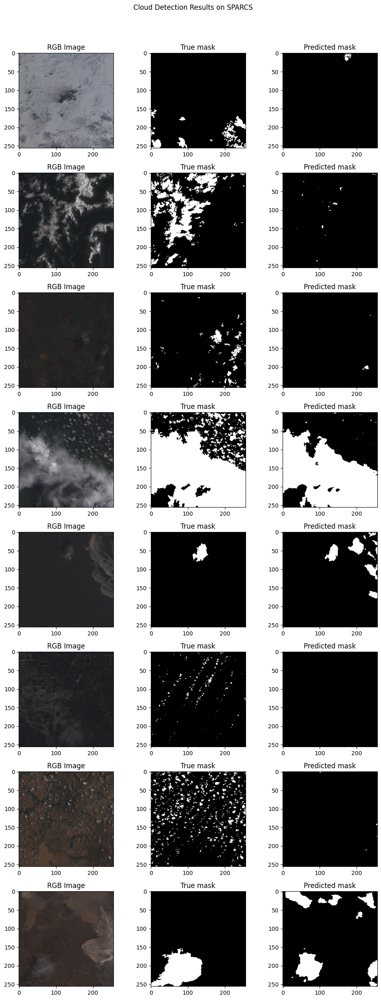

In [22]:
fig, ax = plt.subplots(len(images), 3, figsize=(10, 25))

res_dir = (results_path / model_name / 'SPARCS')
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

for i, im in enumerate(images):
    # inputs, targets = test_list[idx]
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(masks[i], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(preds[i], cmap='gray')
    ax[i, 2].set_title('Predicted mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on SPARCS')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

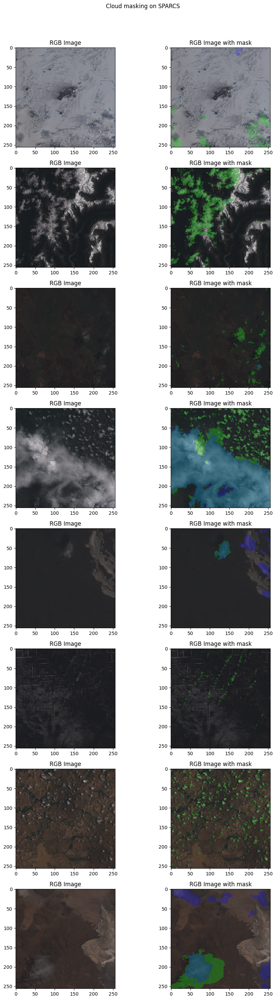

In [23]:
fig, ax = plt.subplots(len(images), 2, figsize=(10, 30))

for i, im in enumerate(images):
    # Remove singleton dimensions from preds[i]
    mask = np.squeeze(preds[i])
    
    # Create an RGB mask where the masked region is colored
    gt_overlay = overlay(im, masks[i].squeeze(), alpha=0.5, color=(0, 1, 0))
    gt_pred_overlay = overlay(gt_overlay, mask, alpha=0.5, color=(0, 0, 1))
    
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    
    ax[i, 1].imshow(gt_pred_overlay)
    ax[i, 1].set_title('RGB Image with mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud masking on SPARCS')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# Display the figure
plt.show()

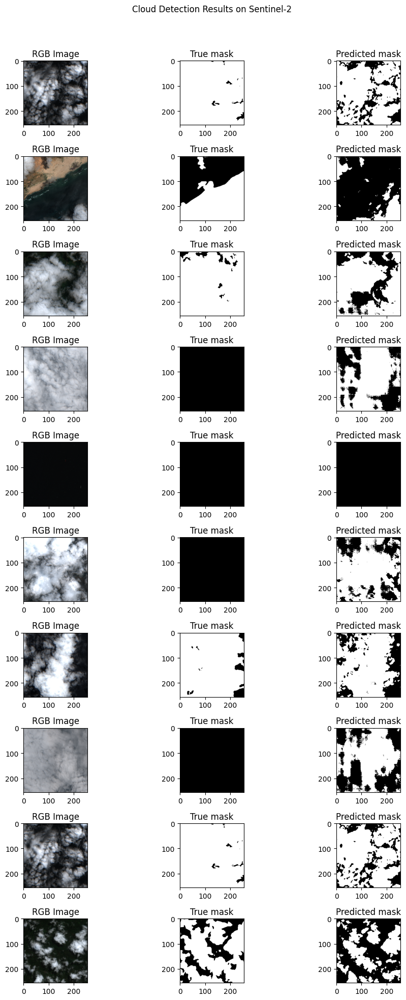

In [25]:
np.random.seed(seed_value)
idxs = np.random.randint(len(S2_images), size=10)

res_dir = (results_path / model_name / 'S2')
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

fig, ax = plt.subplots(len(idxs), 3, figsize=(10, 20))

for i, idx in enumerate(idxs):
    ax[i, 0].imshow(S2_images[idx])
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(S2_masks[idx], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(y_pred_binary_S2[idx], cmap='gray')
    ax[i, 2].set_title('Predicted mask')

# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Sentinel-2')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

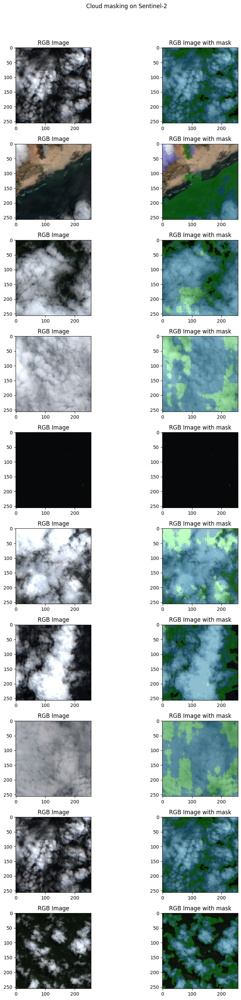

In [26]:
fig, ax = plt.subplots(len(idxs), 2, figsize=(10, 30))

for i, idx in enumerate(idxs):
    # Remove singleton dimensions from preds[i]
    mask = np.squeeze(y_pred_binary_S2[idx])
    
    # Create the overlays  
    gt_overlay = overlay(S2_images[idx], S2_masks[idx].squeeze(), alpha=0.5, color=(0, 1, 0))
    gt_pred_overlay = overlay(gt_overlay, mask, alpha=0.5, color=(0, 0, 1))
    
    ax[i, 0].imshow(S2_images[idx])
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(gt_pred_overlay)
    ax[i, 1].set_title('RGB Image with mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud masking on Sentinel-2')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# Display the figure
plt.show()

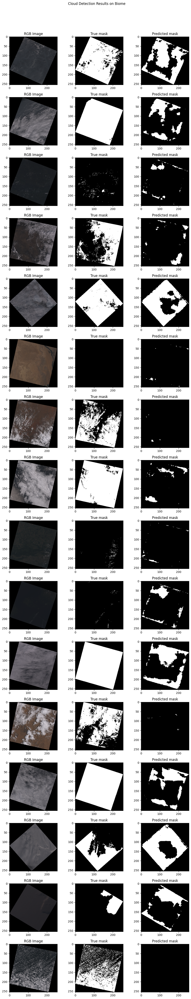

In [27]:
fig, ax = plt.subplots(len(biome_images), 3, figsize=(10, 50))

res_dir = (results_path / model_name / 'Biome')
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

for i, im in enumerate(biome_images):
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(biome_masks[i], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(biome_preds[i], cmap='gray')
    ax[i, 2].set_title('Predicted mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Biome')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

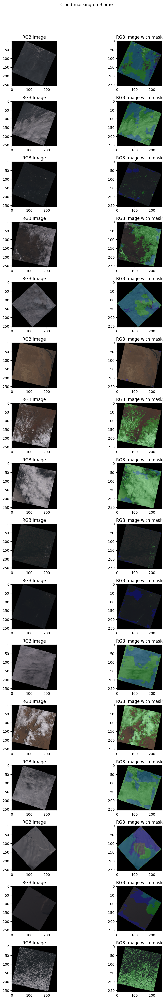

In [28]:
fig, ax = plt.subplots(len(biome_images), 2, figsize=(10, 40))

for i, im in enumerate(biome_images):
    # Remove singleton dimensions from preds[i]
    mask = np.squeeze(biome_preds[i])
    
    # Create the overlays
    gt_overlay = overlay(im, biome_masks[i].squeeze(), alpha=0.5, color=(0, 1, 0))
    gt_pred_overlay = overlay(gt_overlay, mask, alpha=0.5, color=(0, 0, 1))
    
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(gt_pred_overlay)
    ax[i, 1].set_title('RGB Image with mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud masking on Biome')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# Display the figure
plt.show()

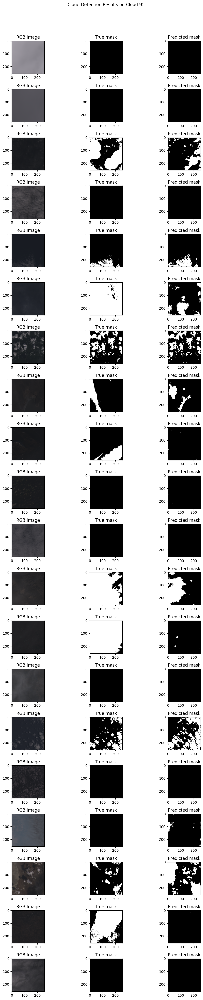

In [29]:
fig, ax = plt.subplots(len(c95_images), 3, figsize=(10, 40))

res_dir = (results_path / model_name / '95Cloud')
if not os.path.exists(res_dir):
        os.makedirs(res_dir, exist_ok=True)

for i, im in enumerate(c95_images):
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(c95_masks[i], cmap='gray')
    ax[i, 1].set_title('True mask')
    ax[i, 2].imshow(c95_preds[i], cmap='gray')
    ax[i, 2].set_title('Predicted mask')

# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Cloud 95')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_1.png'))

# # Display the figure
plt.show()

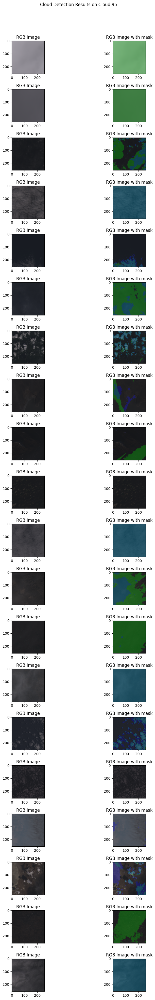

In [30]:
fig, ax = plt.subplots(len(c95_images), 2, figsize=(10, 40))

for i, im in enumerate(c95_images):
    mask = np.squeeze(c95_preds[i])
    
    gt_overlay = overlay(im, c95_masks[i].squeeze(), alpha=0.5, color=(0, 1, 0))
    gt_pred_overlay = overlay(gt_overlay, mask, alpha=0.5, color=(0, 0, 1))
    
    ax[i, 0].imshow(im)
    ax[i, 0].set_title('RGB Image')
    ax[i, 1].imshow(gt_pred_overlay)
    ax[i, 1].set_title('RGB Image with mask')
    
# Add a title for the entire plot
plt.suptitle('Cloud Detection Results on Cloud 95')

# Adjust the spacing between subplots and from the top of the figure
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig(os.path.join(res_dir, 'comp_2.png'))

# # Display the figure
plt.show()